# Predicting the Air Quality Index of Indian Cities using Machine Learning
<hr/>

**Goal of the Competition**

Air is what keeps humans alive. Monitoring it and understanding its quality is of immense importance to our well-being. In this hackathon, participants will have the opportunity to use their data analysis and machine learning skills to forecast the AQI for major Indian AQI stations for the upcoming 28 days. The dataset consists of the historical daily average of several air pollutants which directly affect the Air Quality Index.

Participants will be required to analyze this data and use it to build accurate models that can predict the AQI for each station.

In [2]:
import io
import base64
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt

from matplotlib import dates as mdates
from collections import defaultdict

%matplotlib inline
pd.options.display.max_rows = 500

## 1. Data Description

The dataset consists of historical daily average pollutants, including SO, CO, PM2.5, and other important factors that affect the air quality index. Keep in mind that different AQI stations have different lengths of historical data. Your challenge in this competition is to forecast average AQI levels across different stations in India for the next 28 days.

<hr/>

**train.csv** - 2 years of historical data for 40 Indian AQI stations
ID_Date: Unique identifier of state, stationid and date

*   `StateCode`: State where the AQI station is located
*   `StationId`: AQI station ID
*   `Date`: Date when the observations where recorded
*   `PM2.5`: Average PM2.5 pollutant level
*   `PM10`: Average PM10 pollutant level
*   `O3`: Average O3 pollutant level
*   `CO`: Average CO pollutant level
*   `SO2`: Average SO2 pollutant level
*   `AQI`: Average Air Quality Index - target variable


**sample_submission.csv** - sample submission file to specify the submission format. This file will remain unchanged throughout the competition.

*   `ID_Date`: Unique identifier of state, stationid and date
*   `AQI`: Average Air Quality Index

**State Description**:

| StateCode | State Name |
| :---: | :---: |
| DL | Delhi |
| KA | Karnataka |
| MH | Maharashtra |  
| WB | West Bengal |
| TN | Tamil Nadu |
| AS | Assam |


<hr/>

**Evaluation Metric**:

Submissions are evaluated on Modified Mean Absolute Error (MMAE) between forecasts and the actual values. The modification here is that it will penalize the under-predictions more heavily than over-predictions with a ratio of 1.5:1.

Note: Winners will be judged on the cumulative score from all the above 4 components. This competition only ranks the submissions on the performance component of the judging criteria.

Let's understand what some of the features actually mean? What are their ranges and what is it's significance!

*   `PM2.5`: 
    *   Fine particulate matter (PM2.5) is an air pollutant that is a concern for people's health when levels in air are high. 
    *   PM2.5 are tiny particles in the air that reduce visibility and cause the air to appear hazy when levels are elevated.
    *   Outdoor PM2.5 levels are most likely to be elevated on days with little or no wind or air mixing.
    *   These tiny particles or droplets in the air that are two and one half microns or less in width. Like inches, meters and miles, a micron is a unit of measurement for distance. There are about 25,000 microns in an inch.
    *   Most studies indicate PM2.5 at or below 12 μg/m3 is considered healthy with little to no risk from exposure. If the level goes to or above 35 μg/m3 during a 24-hour period, the air is considered unhealthy and can cause issues for people with existing breathing issues such as asthma. Prolonged exposure to levels above 50 μg/m3 can lead to serious health issues and premature mortality.
    *   [Fine Particles (PM 2.5) Questions and Answers](https://www.indoorairhygiene.org/pm2-5-explained/#:~:text=Most%20studies%20indicate%20PM2.,breathing%20issues%20such%20as%20asthma.) - Department of Health NY
    *   [PM2.5 Explained](https://www.indoorairhygiene.org/pm2-5-explained/#:~:text=Most%20studies%20indicate%20PM2.,breathing%20issues%20such%20as%20asthma.) - Indoor Air Hygiene Institute

*   `PM10`:
    *   PM10 includes particles less than 10 µm in diameter, PM2.5 those less than 2.5 µm. *Therefore, PM2.5 comprises a portion of PM10.*
    *   PM10 and PM2.5 often derive from different emissions sources, and also have different chemical compositions. 
    *   Emissions from combustion of gasoline, oil, diesel fuel or wood produce much of the PM2.5 pollution found in outdoor air, as well as a significant proportion of PM10. 
    *   PM10 also includes dust from construction sites, landfills and agriculture, wildfires and brush/waste burning, industrial sources, wind-blown dust from open lands, pollen and fragments of bacteria.
    *   [Inhalable Particulate Matter and Health (PM2.5 and PM10)](https://ww2.arb.ca.gov/resources/inhalable-particulate-matter-and-health) - California Air Resources Board

| <img src="https://ww2.arb.ca.gov/sites/default/files/inline-images/human_hair_0.png" width=700 height=500/ align="center" /> | 
|:--:| 
| Credit: [California Air Resources Board](https://ww2.arb.ca.gov/resources/inhalable-particulate-matter-and-health) |


*   `O3`:
    *   Ozone is a pale blue gas, soluble in water and non-polar solvents with specific sharp odor somewhat resembling chlorine bleach.
    *   Ozone cracking in car tires, gaskets, O-rings is caqused by attack of ozone on any polymer possessing olefinic or double bonds within its chain structure.

*   `CO`:
    *   Carbonous oxide, is a colorless, odorless and tasteless gas which is slightly lighter than air.
    *   It is highly toxic to humans and animals in higher quantities. Mainly formed by incomplete combustion of carbon containing fuels.

*   `SO2`:
    *   It is the chemical compound produced by volcanoes and in various industrial processes and are also a precursor to particulates in the atmosphere. 

*   Revised National Ambient Air Quality Standards (NAAQS) [NAAQS Notification dated 18th November, 2009] [(Refer Page 90-97)](https://cpcb.nic.in/upload/NAAQS_2019.pdf):

|S. No.|Pollutants|Time Weighted Average|Concentration in Ambient Air| |
|:---:|:---:|:---:|:---:|:---:|
| | | |Industrial,Residential, Rural and other Areas|Ecologically Sensitive Area (notified by Central Government)|
|1|Sulphur Dioxide (SO2)|Annual|50|20|
| | |24 Hours|80|80|
|2|Nitrogen Dioxide (NO2)|Annual|40|30|
| | |24 Hours|80|80|
|3|Particulate Matter (PMIO)|Annual|60|60|
| | |24 Hours|100|100|
|4|Particulate Matter (PM2.5)|Annual|40|40|
| | |24 Hours|60|60|
|5|Ozone (03), pg/m3|8 hours|100|100|
| | |1 hours|180|180|
|6|Carbon Monoxide (CO),|8 Hours|2|2|
| | |1 Hour|4|4|


In [4]:
# Read the datasets
train = pd.read_csv("./data/train.csv")
sample_submission = pd.read_csv("./data/sample_submission.csv")

In [ ]:
train.head()

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI
0,AS_4_2021-08-17,AS,4,2021-08-17,51.8364,120.3702,18.0234,0.4896,14.3106,94.0
1,AS_4_2021-08-18,AS,4,2021-08-18,59.4762,87.0978,34.5270,0.4794,14.7594,124.0
2,AS_4_2021-08-19,AS,4,2021-08-19,61.0776,79.6008,42.0546,0.5202,16.7484,82.0
3,AS_4_2021-08-20,AS,4,2021-08-20,56.7222,94.2072,45.7878,0.4998,27.6114,107.0
4,AS_4_2021-08-21,AS,4,2021-08-21,85.3332,136.7820,44.5638,1.1118,26.4180,107.0


In [ ]:
sample_submission.head()

,ID_Date,AQI
0,AS_4_2022-12-04,10.0
1,AS_4_2022-12-05,10.0
2,AS_4_2022-12-06,10.0
3,AS_4_2022-12-07,10.0
4,AS_4_2022-12-08,10.0


## 2. Basic Statistics

In [ ]:
print(f"Training dataset has {train.shape[0]} rows and {train.shape[1]} columns")
print(f"Sample Submission has {sample_submission.shape[0]} rows and {sample_submission.shape[1]} columns")

Training dataset has 25340 rows and 10 columns
Sample Submission has 1120 rows and 2 columns


In [ ]:
train.describe()

,StationId,PM2.5,PM10,O3,CO,SO2,AQI
count,25340.000000,25339.000000,25338.000000,25324.000000,25339.000000,25340.000000,25340.000000
mean,19.700552,84.722233,176.876226,36.328698,1.135535,12.531818,190.841555
std,11.000809,80.605257,132.003679,23.356473,0.759970,8.917706,127.643584
min,4.000000,0.199500,0.220500,0.052500,0.000000,0.010500,14.000000
25%,11.000000,30.280000,73.751550,18.647400,0.612000,6.293400,91.000000
50%,16.000000,58.027800,142.509300,31.951500,0.969000,10.830000,152.000000
75%,29.000000,109.168500,247.224000,49.600500,1.459500,16.605600,276.000000
max,41.000000,935.003400,1020.000000,194.146800,8.863800,166.943400,975.000000


We find:

*   Maximum values for each feature are quite high compared to their 75% quartile range - refers to skewness present in the data.
*   Mean values are near to their median values expect for `PM2.5` and `AQI`.

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25340 entries, 0 to 25339
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID_Date    25340 non-null  object 
 1   StateCode  25340 non-null  object 
 2   StationId  25340 non-null  int64  
 3   Date       25340 non-null  object 
 4   PM2.5      25339 non-null  float64
 5   PM10       25338 non-null  float64
 6   O3         25324 non-null  float64
 7   CO         25339 non-null  float64
 8   SO2        25340 non-null  float64
 9   AQI        25340 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 1.9+ MB


We find:

*   `PM2.5`, `PM10`, `O3`, `CO`, `SO2`, `AQI` - These are numeric (float64) columns.
*   `StationId`: It is a numeric (int64) column.
*   `ID_Date`, `StateCode`, `Date` - These columns are of type object.
*   There are some missing values present in the dataset.

In [ ]:
train.groupby(by=["StateCode"]).StationId.nunique()

StateCode
AS     1
DL    20
KA     5
MH     8
TN     2
WB     4
Name: StationId, dtype: int64

In [ ]:
train.groupby(by=["StateCode"]).StationId.nunique().sum()

40

We find:

*   There are 6 states, and for each state, stationId we have to predict for 28 days AQI values.
*   The total for stationId is 40, hence 40 * 28 = 1120.

## 3. Exploratory Data Analysis

In [ ]:
train.head()

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI
0,AS_4_2021-08-17,AS,4,2021-08-17,51.8364,120.3702,18.0234,0.4896,14.3106,94.0
1,AS_4_2021-08-18,AS,4,2021-08-18,59.4762,87.0978,34.5270,0.4794,14.7594,124.0
2,AS_4_2021-08-19,AS,4,2021-08-19,61.0776,79.6008,42.0546,0.5202,16.7484,82.0
3,AS_4_2021-08-20,AS,4,2021-08-20,56.7222,94.2072,45.7878,0.4998,27.6114,107.0
4,AS_4_2021-08-21,AS,4,2021-08-21,85.3332,136.7820,44.5638,1.1118,26.4180,107.0


In [ ]:
# Check for missing values
train.isnull().sum().sort_values(ascending=False)

O3           16
PM10          2
PM2.5         1
CO            1
ID_Date       0
StateCode     0
StationId     0
Date          0
SO2           0
AQI           0
dtype: int64

We find:

*   `O3` has the most number of missing values, followed by `PM10`, `PM2.5`, and `CO`.
*   We would have to investigate if these values can be imputed or needs to be removed.

In [ ]:
train.StateCode.value_counts()

DL    15862
KA     3445
MH     2819
WB     2056
TN      694
AS      464
Name: StateCode, dtype: int64

We find:

*   There are total 6 unique states data present.
*   `DL` - Delhi is the most prominent state in the dataset.
*   There is skewness in distribution of states in the dataset.

In [ ]:
train.StationId.nunique()

29

In [ ]:
train.StationId.value_counts()

14    1598
12    1555
13    1554
16    1129
10    1043
8     1036
11    1026
4     1024
21     837
25     837
26     837
19     837
29     837
30     837
6      837
35     837
38     837
18     837
40     837
41     837
27     837
7      691
9      688
32     687
39     687
23     687
15     359
17     351
5      344
Name: StationId, dtype: int64

We find:

*   There are 29 different StationId.
*   Distribution of many StationId's are the same. There is a skewness in the StationId as well.



In [ ]:
# Check out the rows containing the missing values
train[train.isnull().any(axis=1)].sort_values(by=['StateCode', 'Date'])

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI
1024,DL_6_2020-08-02,DL,6,2020-08-02,187.25,359.17,NaN,0.97,11.00,376.0
2547,DL_12_2020-08-02,DL,12,2020-08-02,NaN,338.44,4.00,1.58,27.68,311.0
4221,DL_18_2020-08-02,DL,18,2020-08-02,200.96,393.25,NaN,1.53,12.11,427.0
5058,DL_19_2020-08-02,DL,19,2020-08-02,185.79,337.06,NaN,1.91,12.98,346.0
7419,DL_25_2020-08-02,DL,25,2020-08-02,126.30,209.51,NaN,0.59,4.24,312.0
8256,DL_26_2020-08-02,DL,26,2020-08-02,149.71,239.92,NaN,0.78,9.67,333.0
9093,DL_27_2020-08-02,DL,27,2020-08-02,160.07,273.29,NaN,0.87,3.40,338.0
10767,DL_30_2020-08-02,DL,30,2020-08-02,144.05,355.21,NaN,1.50,6.72,360.0
14652,DL_40_2020-08-02,DL,40,2020-08-02,140.67,283.33,NaN,0.74,12.49,330.0
1025,DL_6_2020-08-03,DL,6,2020-08-03,146.50,299.54,NaN,0.85,14.29,329.0


We find:

*   Particularly the majority of the missing values are for `Delhi` on 2nd & 3rd of August 2020. Although there were a lot of covid cases in India at that time but it does not indicate why these two days have missing values. Since, covid was around for quite some time and no other dates have missing values.
*   Another instance of missing values is in `Karnataka` on 4th and 5th of January 2021.

In [ ]:
train.head()

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI
0,AS_4_2021-08-17,AS,4,2021-08-17,51.8364,120.3702,18.0234,0.4896,14.3106,94.0
1,AS_4_2021-08-18,AS,4,2021-08-18,59.4762,87.0978,34.5270,0.4794,14.7594,124.0
2,AS_4_2021-08-19,AS,4,2021-08-19,61.0776,79.6008,42.0546,0.5202,16.7484,82.0
3,AS_4_2021-08-20,AS,4,2021-08-20,56.7222,94.2072,45.7878,0.4998,27.6114,107.0
4,AS_4_2021-08-21,AS,4,2021-08-21,85.3332,136.7820,44.5638,1.1118,26.4180,107.0


In [ ]:
# Look at since when the data was collected for each state. Also, till when was the data collected.
grouped = train.groupby(by=["StateCode"])

start_dates = grouped.Date.min()
end_dates = grouped.Date.max()

date_df = pd.DataFrame(list(zip(start_dates.values, end_dates.values)), index=start_dates.index.values, columns=["StartDate", "EndDate"]).sort_values("StartDate")

date_df.StartDate = date_df.StartDate.apply(lambda x: dt.datetime.strptime(x,'%Y-%m-%d'))
date_df.EndDate = date_df.EndDate.apply(lambda x: dt.datetime.strptime(x,'%Y-%m-%d'))

date_df['Difference'] = date_df.EndDate - date_df.StartDate

In [ ]:
date_df

,StartDate,EndDate,Difference
DL,2020-08-02,2022-12-03,853 days
WB,2020-10-11,2022-12-03,783 days
KA,2020-12-30,2022-12-03,703 days
AS,2021-08-17,2022-12-03,473 days
MH,2021-12-04,2022-12-03,364 days
TN,2021-12-13,2022-12-03,355 days


We find:

*   We observe that the start dates for each state varies.
*   `Delhi` has data for more than a year when compared to other states. This also indicates why we have more data for some states.

Let's look at some statistics state wise for different features

Later on we'll dig deeper and check at StationId level, Yearly, and Monthly.

In [ ]:
# Similarly check for dates we need to predict from the sameple submission
split_groups = sample_submission.ID_Date.apply(lambda x: x.split("_"))
sample_submission['StateCode'] = [row[0] for row in split_groups]
sample_submission['StationId'] = [row[1] for row in split_groups]
sample_submission['Date'] = [row[2] for row in split_groups]

sample_submission.Date = sample_submission.Date.apply(lambda x: dt.datetime.strptime(x,'%Y-%m-%d'))

sample_grouped = sample_submission.groupby(by=["StateCode", "StationId"])

sample_start_date = sample_grouped.Date.min()
sample_end_date = sample_grouped.Date.max()

sample_date_df = pd.DataFrame(list(zip(sample_start_date.values, sample_end_date.values)), index=sample_start_date.index.values, columns=["StartDate", "EndDate"]).sort_index()

sample_date_df

,StartDate,EndDate
"(AS, 4)",2022-12-04,2022-12-31
"(DL, 12)",2022-12-04,2022-12-31
"(DL, 13)",2022-12-04,2022-12-31
"(DL, 18)",2022-12-04,2022-12-31
"(DL, 19)",2022-12-04,2022-12-31
"(DL, 21)",2022-12-04,2022-12-31
"(DL, 23)",2022-12-04,2022-12-31
"(DL, 25)",2022-12-04,2022-12-31
"(DL, 26)",2022-12-04,2022-12-31
"(DL, 27)",2022-12-04,2022-12-31


In [ ]:
# Check the statistics for releveant features
relevant_cols = ['PM2.5', 'PM10', 'O3', 'CO', 'SO2', 'AQI']

In [ ]:
# Mean statewise
grouped[relevant_cols].agg(['mean', 'median'])

PM2.5                 PM10                    O3            \
                 mean   median        mean     median       mean    median   
StateCode                                                                    
AS          68.673807  52.3209  125.605026  100.96470  25.686966  19.80300   
DL         109.444961  81.7632  226.827221  201.31890  37.457291  33.14425   
KA          32.610387  30.4500   75.320821   72.45000  40.486084  36.58740   
MH          39.869489  23.5824   96.970733   75.04350  26.632071  19.57200   
TN          28.636210  25.5780   60.779362   45.20775  48.380022  38.95935   
WB          65.368235  45.6330  121.889471   84.84000  32.293213  30.75300   

                 CO                SO2                   AQI         
               mean  median       mean    median        mean median  
StateCode                                                            
AS         0.774790  0.6300  15.032071  14.31570  150.309806  106.0  
DL         1.346106  1.1526  14.730964  13.19425  238.388854  213.0  
KA         0.907938  0.7956   6.210320   5.10000   91.252250   89.0  
MH         0.585328  0.4488  10.681013   7.70700  109.768269   91.0  
TN         0.799319  0.7140   9.277744   9.18000   90.245677   80.0  
WB         0.841527  0.6720   9.229447   7.37460  145.148833   98.0

In [ ]:
state_station_group = train.groupby(by=['StateCode', 'StationId'])

In [ ]:
state_station_group[relevant_cols].agg(['mean', 'median'])

PM2.5                   PM10                    O3  \
                           mean     median        mean     median       mean   
StateCode StationId                                                            
AS        4           68.673807   52.32090  125.605026  100.96470  25.686966   
DL        4          111.819726   85.35225  207.307627  189.57780  34.679518   
          6          117.030002   88.31000  232.308875  204.70380  39.302835   
          8          125.478530   99.23070  240.316835  210.27870  46.706545   
          12          84.895038   56.17000  189.769879  170.62560  42.202453   
          13         107.021649   84.55800  284.819039  269.17000  41.696392   
          18         132.426537  106.12000  266.776943  249.15450  27.831662   
          19         100.814603   71.38000  215.373623  192.08000  40.183434   
          21          95.683018   75.65340  209.607166  185.59920  31.080040   
          23         127.630724   96.07500  278.110916  256.76700  30.533631   
          25          89.047901   75.65000  174.845151  163.07760  47.857957   
          26         112.480127   92.88000  239.035192  215.64840  41.923621   
          27         121.113718   80.54550  222.010581  194.78940  44.695807   
          29         103.737433   77.68000  222.999259  197.17000  26.655585   
          30          97.008966   73.22700  191.968961  165.90300  29.570292   
          32          99.942791   68.53380  204.746057  188.19000  29.214950   
          35         126.463956   94.23750  254.407906  226.69500  33.070598   
          38         107.243069   83.50000  216.426500  197.45160  45.887343   
          39          88.665117   61.70850  158.769922  141.98100  48.589230   
          40         110.207005   80.07000  231.330142  203.92050  40.433253   
          41         131.670664   98.92050  284.624344  257.25420  27.086074   
KA        7           36.727201   35.31240   78.313409   72.38000  41.544074   
          9           29.729533   27.58590   64.355328   61.56675  33.137936   
          10          28.605401   26.70150   65.362579   58.46640  50.096828   
          11          33.844751   30.44190   79.747163   72.43500  40.964570   
          14          34.114716   30.89000   88.710766   85.04760  36.712821   
MH        10          43.004586   23.12850  112.148456   83.18100  13.978018   
          11          40.584375   22.62750   84.021625   65.77725  38.099509   
          12          42.749655   25.75650  129.317495  108.84420  30.253972   
          13          35.089613   23.78130   74.337390   64.96875  26.187295   
          14          44.025947   28.09275  120.143410   90.34410  25.544118   
          15          35.846179   18.96300   78.251132   57.40350  20.981639   
          16          37.781479   17.62950   88.146109   58.44300  23.998639   
          17          40.156058   23.65380   89.917004   75.56160  34.736544   
TN        5           25.891572   20.82840   81.236942   56.33790  65.874222   
          8           31.333797   30.62415   40.672484   38.91750  31.185723   
WB        12          58.806615   42.03180  107.637884   71.35410  32.999021   
          13          44.125462   34.36650   87.285174   61.69800  20.726912   
          14          91.972134   67.17900  178.572331  137.38380  35.939480   
          16          58.836104   37.83525  103.131291   65.19250  34.678485   

                                     CO                 SO2            \
                       median      mean   median       mean    median   
StateCode StationId                                                     
AS        4          19.80300  0.774790  0.63000  15.032071  14.31570   
DL        4          31.78380  0.971362  0.85680  21.077445  17.91125   
          6          38.38000  1.173074  0.95880  16.910989  16.02000   
          8          43.07000  1.295971  1.15260  15.270794  14.37690   
          12         34.71300  1.183857  1.08000  19.694100  18.30900   
 

In [ ]:
# Let's explore year and month wise
train.Date = train.Date.apply(lambda x: dt.datetime.strptime(x,'%Y-%m-%d'))

In [ ]:
train['year'] = train.Date.apply(lambda x: x.year)
train['month'] = train.Date.apply(lambda x: x.month)

In [ ]:
# Statitics Year and State wise
train.groupby(by=['year', 'StateCode'])[relevant_cols].agg(['mean', 'median'])

PM2.5                 PM10                    O3  \
                      mean   median        mean     median       mean   
year StateCode                                                          
2020 DL         100.394805  92.1200  269.210703  253.05000  52.261085   
     KA          25.815000  25.8150   80.395000   80.39500   9.575000   
     WB          20.222875  24.3700   39.404625   40.66000  38.637875   
2021 AS          62.751482  44.7372  115.024666   81.31950  35.004275   
     DL         115.481350  85.7616  243.560023  220.57500  36.333956   
     KA          36.823863  36.2508   84.384317   85.79220  41.892153   
     MH          15.326845  15.1878   61.941096   56.46720  12.224919   
     TN          30.054980  25.4031   41.543240   39.97380  23.641220   
     WB          88.588254  56.3856  150.269311  108.29500  30.274457   
2022 AS          71.028467  55.1157  129.811675  114.84180  21.982493   
     DL         106.069840  70.3500  195.069743  161.16720  33.764060   
     KA          28.092895  25.6833   65.590559   61.73520  39.013073   
     MH          41.375683  25.7565   99.120519   79.07550  27.516245   
     TN          28.572109  25.5780   61.648464   45.63840  49.497739   
     WB          56.757585  43.3440  113.010444   78.74475  32.896061   

                                CO                 SO2                   AQI  \
                  median      mean   median       mean    median        mean   
year StateCode                                                                 
2020 DL         51.10000  1.095152  0.96000  11.737408   9.40000  258.273469   
     KA          9.57500  0.580000  0.58000   8.085000   8.08500   84.500000   
     WB         41.77000  0.337625  0.00000  17.585125  10.32000   70.925000   
2021 AS         37.16370  0.714966  0.62220  18.924709  18.05910  130.424242   
     DL         32.33000  1.504130  1.29540  17.265020  15.90180  249.145219   
     KA         41.37000  0.931733  0.79000   6.154622   5.53860  100.340998   
     MH          9.58800  0.323584  0.31620   9.290761   7.34400   69.319018   
     TN         23.91900  0.930920  1.05060  10.499880  10.00620   60.600000   
     WB         29.30460  0.918874  0.75480   8.562764   6.03840  177.031636   
2022 AS         18.98865  0.798576  0.63525  13.484395  13.74705  158.216114   
     DL         28.26420  1.262446  1.09200  13.047127  12.06660  220.418524   
     KA         35.34810  0.882578  0.79680   6.267886   3.75360   81.498193   
     MH         21.17325  0.601391  0.47595  10.766333   7.78650  112.250659   
     TN         39.39900  0.793373  0.70890   9.222527   9.13200   91.585090   
     WB         31.40055  0.834141  0.64050   9.051402   7.40010  134.062877   

                       
               median  
year StateCode         
2020 DL         246.0  
     KA          84.5  
     WB          69.0  
2021 AS          94.5  
     DL         222.0  
     KA         102.0  
     MH          65.0  
     TN          64.0  
     WB         112.0  
2022 AS         114.0  
     DL         174.0  
     KA          80.0  
     MH          95.0  
     TN          81.0  
     WB          97.0

In [ ]:
# Statitics Year and State wise
train.groupby(by=['year', 'month', 'StateCode'])[relevant_cols].agg(['mean', 'median'])

PM2.5                   PM10                    O3  \
                            mean     median        mean     median       mean   
year month StateCode                                                            
2020 8     DL         149.052129  149.75000  302.605679  297.42000  36.140617   
     9     DL         104.274089  102.16000  255.546111  248.07000  47.582800   
     10    DL          90.553733   89.21000  278.209533  274.92000  60.833933   
           WB          24.676500   24.37000   42.895000   40.66000  38.845000   
     11    DL          89.129800   87.19000  259.956778  257.52500  63.633900   
           WB          18.066000   24.37000   35.396000   40.66000  40.872000   
     12    DL          73.938133   60.00000  253.074911  186.31000  50.928956   
           KA          25.815000   25.81500   80.395000   80.39500   9.575000   
           WB          19.410667   19.38500   41.086333   30.66500  36.265667   
2021 1     DL          38.632014   36.38500  106.257760   97.88000  31.186181   
           KA          18.312162   16.75500   55.271507   48.40000  15.586284   
           WB          22.626774   18.81000   41.660323   37.89000  17.320645   
     2     DL          38.801880   35.50000  125.932256  101.61375  22.055559   
           KA          18.254821   15.33500   56.690982   42.19000  12.855196   
           WB          21.128304   18.61000   42.181964   39.40500  12.270804   
     3     DL          42.530000   38.24000  119.159368  109.89000  25.523544   
           KA          25.447267   23.78000   65.634467   56.58000  22.627800   
           WB          38.482333   35.58500   65.798000   60.21500  20.260000   
     4     DL         135.920430  123.26500  312.730974  300.03000  37.397211   
           KA          41.439100   42.30000   88.394600   86.37000  24.143300   
           WB          70.776333   81.44500  116.646833  134.21500  32.426500   
     5     DL         209.875722  201.20000  358.445891  349.60000  31.184041   
           KA          43.208000   43.31500   83.668733   85.17000  26.099867   
           WB         152.505370  151.60000  242.466481  239.95500  38.064259   
     6     DL         236.613042  225.82500  391.359533  385.82000  24.695808   
           KA          51.501300   51.56500  100.269633   96.90250  50.145233   
           WB         183.210000  186.75500  293.784917  295.81500  34.597333   
     7     DL         218.509335  198.12990  344.447074  325.19130  24.060615   
           KA          56.364279   55.51860  110.527726  107.96700  64.632991   
           WB         206.143810  193.09110  316.873694  301.63440  30.113032   
     8     AS          85.025500   67.26900  141.899850  118.77900  30.459750   
           DL         128.187516  115.61190  227.795726  210.38010  30.232326   
           KA          45.590576   45.46140  100.159701   98.38410  61.353729   
           WB         130.354361  128.37210  222.580575  217.24980  31.571914   
     9     AS         100.023750  100.98510  187.972910  193.49910  38.726170   
           DL          87.772641   84.75690  193.824896  188.17470  39.672016   
           KA          43.622952   42.36315  109.789706  105.32520  63.823712   
           WB          74.355620   72.74640  137.696260  133.38030  35.287495   
     10    AS          51.911540   50.35740   87.918220   80.80950  41.260700   
           DL          82.264428   77.42310  242.216867  240.87300  53.528291   
           KA          38.855200   39.25980   94.677692   95.86470  62.572580   
           WB          42.596560   40.64190   86.127270   78.49410  29.644430   
     11    AS          60.742870   28.20300  120.152940   51.27030  49.088520   
           DL          89.793651   80.51880  256.003238  243.55560  58.067861   
           KA          36.453950   36.33240   89.014176   91.28490  55.316232   
           WB          44.612845   44.46690  100.736815   94.79880  27.920545   
     12    AS          29.418160   27.27480   53.304520   

In [ ]:
train.groupby(by=['year', 'StateCode', 'StationId'])[relevant_cols].agg(['mean', 'median'])

PM2.5                   PM10              \
                                mean     median        mean      median   
year StateCode StationId                                                  
2020 DL        6          112.353095  105.21000  298.097551  291.080000   
               12          44.365137   45.99500  193.339796  166.380000   
               13         104.598980   94.29000  299.948571  284.170000   
               18         137.851701  128.54000  325.906156  315.750000   
               19          95.468129   87.21000  253.818435  244.900000   
               21         100.613435   92.38000  262.672041  251.830000   
               25          85.531122   85.54000  238.602653  224.460000   
               26         112.964932  111.58000  288.895408  269.540000   
               27          99.446531   88.07000  232.286735  209.210000   
               29          92.349184   84.09000  269.127517  255.960000   
               30          86.100000   83.04000  214.928469  195.660000   
               35         107.013401   97.12000  319.226156  312.150000   
               38         105.200748   95.47000  268.087143  252.660000   
               40         105.130510   96.04000  245.772755  243.080000   
               41         116.554014  107.83000  327.451156  314.580000   
     KA        7           23.080000   23.08000   54.710000   54.710000   
               14          28.550000   28.55000  106.080000  106.080000   
     WB        16          20.222875   24.37000   39.404625   40.660000   
2021 AS        4           62.751482   44.73720  115.024666   81.319500   
     DL        4          130.191778  101.43390  254.529065  243.448500   
               6          123.196303   87.95970  240.365102  210.803400   
               8          126.156719  104.71770  270.388230  238.884000   
               12          92.507197   71.18070  205.770126  197.334300   
               13         104.863007   83.26260  298.475808  284.029200   
               18         140.793358  108.15060  282.437522  259.120800   
               19         106.116540   70.07730  226.982717  207.216500   
               21          98.577306   76.82020  219.020839  194.379300   
               23         135.699029  104.29500  323.857941  317.638200   
               25          92.444851   76.15320  172.311816  158.885400   
               26         119.129470   91.45610  244.089387  223.714050   
               27         129.543395   83.23200  236.050307  203.933000   
               29         107.883153   78.77460  230.505879  205.830900   
               30         104.608673   75.39585  207.749375  182.666700   
               32         101.315215   71.84880  231.213073  219.402000   
               35         136.466656  105.16455  265.390068  237.435600   
               38         119.464962   86.51620  224.870606  209.091300   
               39          90.400997   66.42240  181.849235  173.430600   
               40         110.909948   77.04000  253.674884  230.703600   
               41         144.660046  107.06940  306.003702  272.508300   
     KA        7           42.877458   41.31000   89.430262   87.145000   
               9           32.268669   31.12520   67.495658   64.425350   
               10          31.491092   30.94000   73.281211   74.400000   
               11          38.062537   35.67450   90.816652   94.011800   
               14          39.356342   37.31050  100.684313   97.001000   
     MH        10          16.692300   17.49300   62.536200   60.078000   
               11           6.545000    6.15570   32.425800   33.042900   
               12          19.711075   20.00730  100.521850   91.993800   
               13          16.407092   15.90690   51.382500   53.417400   
               14          20.089920   21.10890   59.211000   54.095700   
               15          12.811200   12.65820   49.227467   48.460200   
               16          12.973644   13.35180   54.292

In [ ]:
train.groupby(by=['year', 'month', 'StateCode', 'StationId'])[relevant_cols].agg(['mean', 'median'])

PM2.5                  PM10            \
                                      mean    median        mean    median   
year month StateCode StationId                                               
2020 8     DL        6          170.068519  172.4600  326.534444  332.7900   
                     12          54.233846   56.4850  269.302593  294.0400   
                     13         169.362593  167.5800  398.277037  389.1800   
                     18         214.854444  218.0400  391.083704  393.2500   
                     19         153.302963  159.4100  279.169259  284.3800   
...                                    ...       ...         ...       ...   
2022 12    TN        8           13.471500   13.2825   24.087000   24.9795   
           WB        12          16.023000   16.0335   43.816500   43.1970   
                     13          11.599000   12.1590   30.282000   29.2635   
                     14          16.334500   16.5795   34.345500   33.5895   
                     16          16.194500   16.6215   30.180500   30.5340   

                                       O3                 CO          \
                                     mean   median      mean  median   
year month StateCode StationId                                         
2020 8     DL        6          34.932400  37.7800  1.095556  0.9600   
                     12         49.191852  54.0800  1.575556  1.4300   
                     13         37.671111  41.6000  2.381481  2.2400   
                     18         13.683200  12.8100  1.734444  1.6100   
                     19         33.458400  37.0000  2.090370  1.6800   
...                                   ...      ...       ...     ...   
2022 12    TN        8          18.987500  18.4065  1.046500  1.0395   
           WB        12          7.416500   4.7250  0.329000  0.3360   
                     13         37.387000  38.0415  0.462000  0.4620   
                     14         72.971500  73.7835  0.273000  0.2625   
                     16         31.482500  30.0510  0.644000  0.6615   

                                      SO2                  AQI         
                                     mean   median        mean median  
year month StateCode StationId                                         
2020 8     DL        6          10.159259  10.4400  335.703704  344.0  
                     12         33.927037  34.3600  234.925926  252.0  
                     13          4.827037   4.8300  380.333333  391.0  
                     18         11.866296  11.6200  392.666667  378.0  
                     19         18.390370  18.2700  311.185185  330.0  
...                                   ...      ...         ...    ...  
2022 12    TN        8           5.796000   5.8170   55.000000   55.0  
           WB        12          3.328500   2.7405   43.666667   44.0  
                     13          7.661500   7.6335   50.333333   51.0  
                     14         12.138000  12.1590  115.666667  107.0  
                     16          8.057000   7.4235   43.000000   41.0  

[893 rows x 12 columns]

## 4. Visualizations

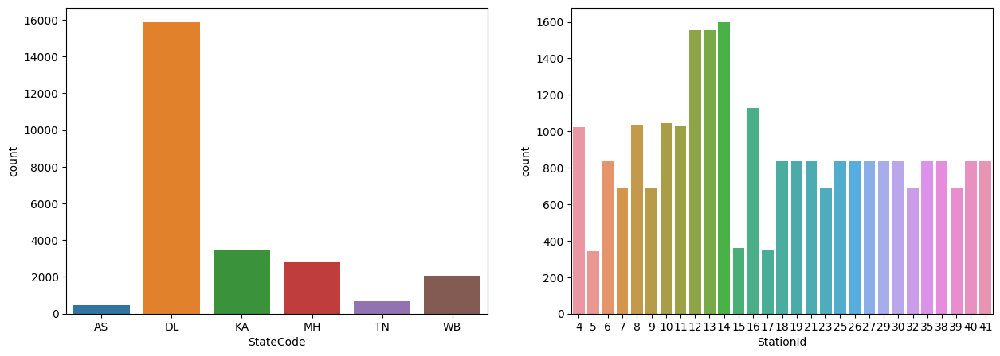

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sns.countplot(x=train.StateCode, ax=axes[0])
sns.countplot(x=train.StationId, ax=axes[1])
plt.show()

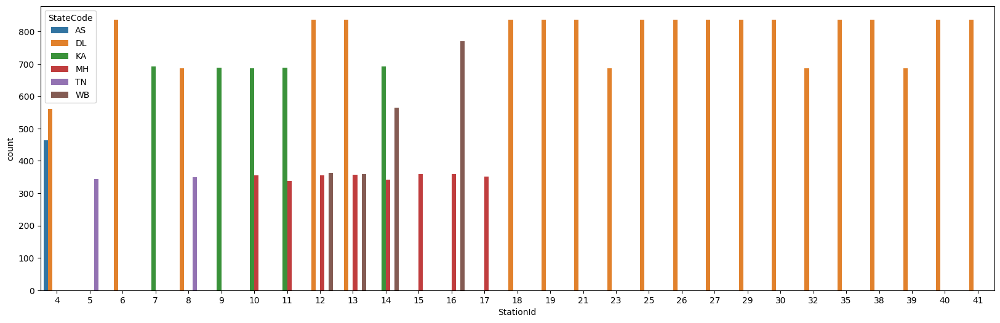

In [ ]:
fig = plt.figure(figsize=(20,6))
sns.countplot(x=train.StationId, hue=train.StateCode)
plt.show()

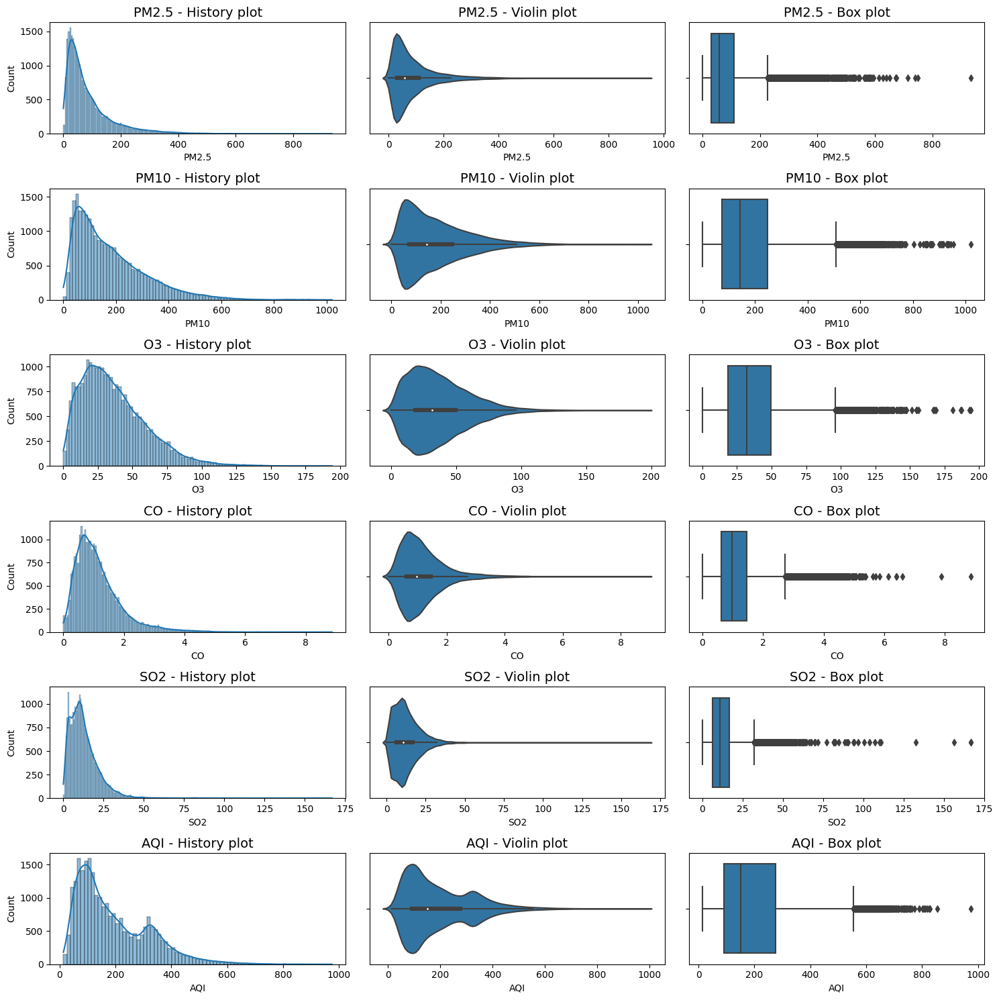

In [ ]:
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(15,15))

for idx, col in enumerate(train.columns[4:-2]):
    sns.histplot(x=train[col], ax=axes[idx][0], kde=True)
    axes[idx][0].set_title(f"{col} - History plot", fontsize=14)
    
    sns.violinplot(x=train[col], ax=axes[idx][1])
    axes[idx][1].set_title(f"{col} - Violin plot", fontsize=14)
    
    sns.boxplot(x=train[col], ax=axes[idx][2])
    axes[idx][2].set_title(f"{col} - Box plot", fontsize=14)

plt.tight_layout()
plt.show()

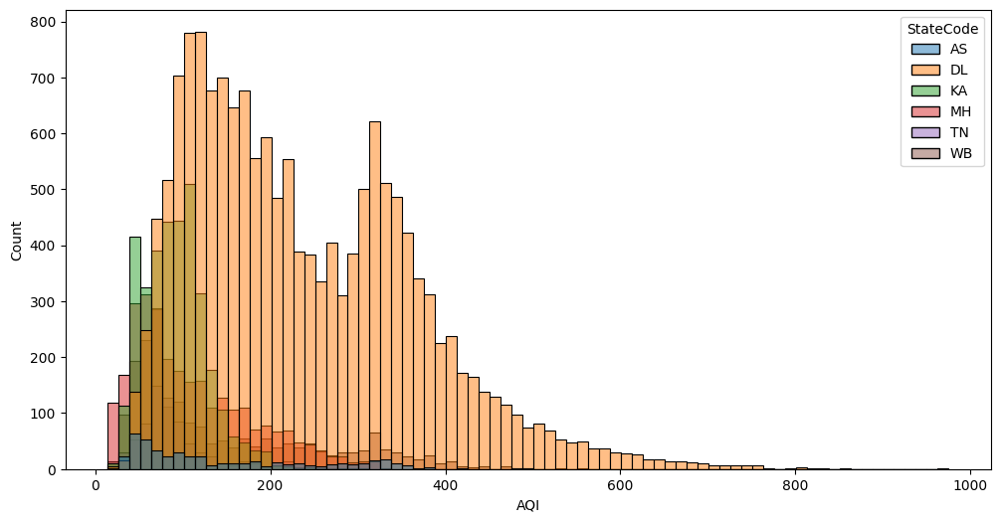

In [ ]:
fig = plt.figure(figsize=(12,6))
sns.histplot(x=train.AQI, hue=train.StateCode)
plt.show()

In [ ]:
# Combine statecode and stationid
train['StateStation'] = train.apply(lambda x: x['StateCode'] + "-" + str(x['StationId']), axis=1)

In [ ]:
train.head()

,ID_Date,StateCode,StationId,Date,PM2.5,PM10,O3,CO,SO2,AQI,year,month,StateStation
0,AS_4_2021-08-17,AS,4,2021-08-17,51.8364,120.3702,18.0234,0.4896,14.3106,94.0,2021,8,AS-4
1,AS_4_2021-08-18,AS,4,2021-08-18,59.4762,87.0978,34.5270,0.4794,14.7594,124.0,2021,8,AS-4
2,AS_4_2021-08-19,AS,4,2021-08-19,61.0776,79.6008,42.0546,0.5202,16.7484,82.0,2021,8,AS-4
3,AS_4_2021-08-20,AS,4,2021-08-20,56.7222,94.2072,45.7878,0.4998,27.6114,107.0,2021,8,AS-4
4,AS_4_2021-08-21,AS,4,2021-08-21,85.3332,136.7820,44.5638,1.1118,26.4180,107.0,2021,8,AS-4


In [ ]:
# Make a copy of train and work on that
df = train.copy(deep=True)
df.set_index("Date", inplace=True)

In [ ]:
df.head()

,ID_Date,StateCode,StationId,PM2.5,PM10,O3,CO,SO2,AQI,year,month,StateStation
Date,,,,,,,,,,,,
2021-08-17,AS_4_2021-08-17,AS,4,51.8364,120.3702,18.0234,0.4896,14.3106,94.0,2021,8,AS-4
2021-08-18,AS_4_2021-08-18,AS,4,59.4762,87.0978,34.5270,0.4794,14.7594,124.0,2021,8,AS-4
2021-08-19,AS_4_2021-08-19,AS,4,61.0776,79.6008,42.0546,0.5202,16.7484,82.0,2021,8,AS-4
2021-08-20,AS_4_2021-08-20,AS,4,56.7222,94.2072,45.7878,0.4998,27.6114,107.0,2021,8,AS-4
2021-08-21,AS_4_2021-08-21,AS,4,85.3332,136.7820,44.5638,1.1118,26.4180,107.0,2021,8,AS-4


In [ ]:
# Set formaters for date type in plots
years = mdates.YearLocator()
months = mdates.MonthLocator()
monthsFmt = mdates.DateFormatter('%B')
yearsFmt = mdates.DateFormatter('\n%Y')

In [ ]:
mapping = defaultdict(list)
for idx, code in enumerate(df.StateCode.unique()):
    for ss in df.StateStation.unique():
        if ss.startswith(code):
            mapping[code].append(ss)

### AQI Distribution

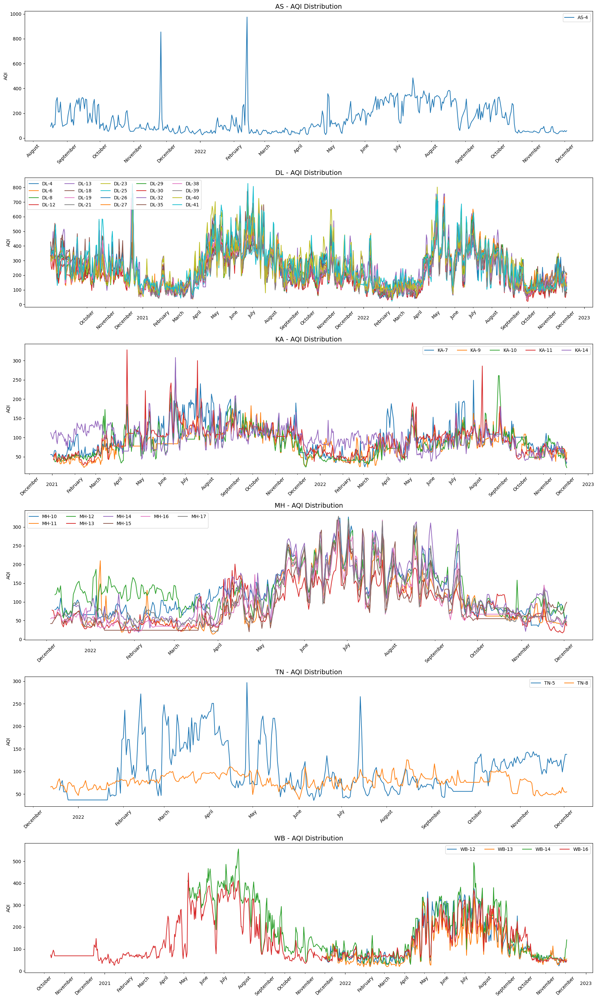

In [ ]:
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(18,30))

for idx, code in enumerate(df.StateCode.unique()):
    count = 0
    for ss in mapping[code]:
        # if ss.startswith(code):
        ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss].AQI, label=ss, ax=axes[idx])
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(monthsFmt)
        plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(yearsFmt)
        ax.legend(loc="best", ncols=5)
        ax.set_xlabel("")
    ax.set_title(f"{code} - AQI Distribution", fontsize=14)

plt.tight_layout()
plt.show()

### PM2.5 Distribution

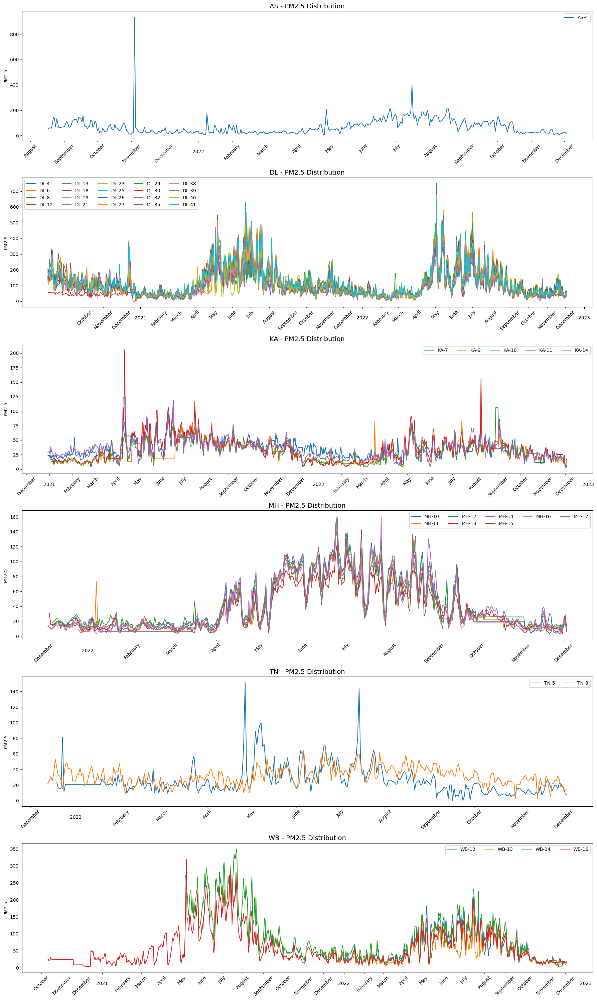

In [ ]:
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(18,30))

for idx, code in enumerate(df.StateCode.unique()):
    count = 0
    for ss in mapping[code]:
        # if ss.startswith(code):
        ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss]['PM2.5'], label=ss, ax=axes[idx])
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(monthsFmt)
        plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(yearsFmt)
        ax.legend(loc="best", ncols=5)
        ax.set_xlabel("")
    ax.set_title(f"{code} - PM2.5 Distribution", fontsize=14)

plt.tight_layout()
plt.show()

### PM10 Distribution

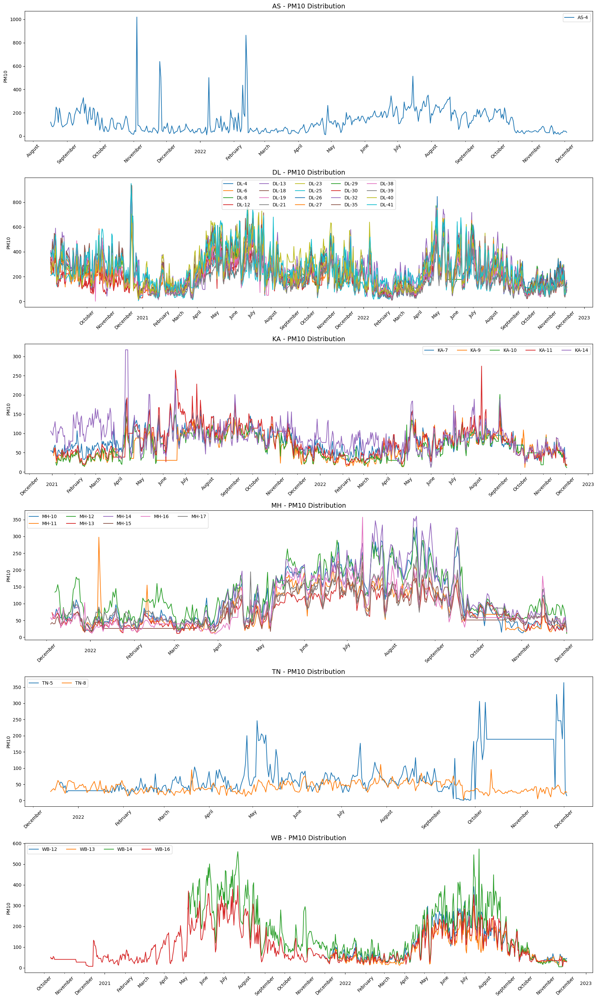

In [ ]:
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(18,30))

for idx, code in enumerate(df.StateCode.unique()):
    count = 0
    for ss in mapping[code]:
        # if ss.startswith(code):
        ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss]['PM10'], label=ss, ax=axes[idx])
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(monthsFmt)
        plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(yearsFmt)
        ax.legend(loc="best", ncols=5)
        ax.set_xlabel("")
    ax.set_title(f"{code} - PM10 Distribution", fontsize=14)

plt.tight_layout()
plt.show()

### O3 Distribution

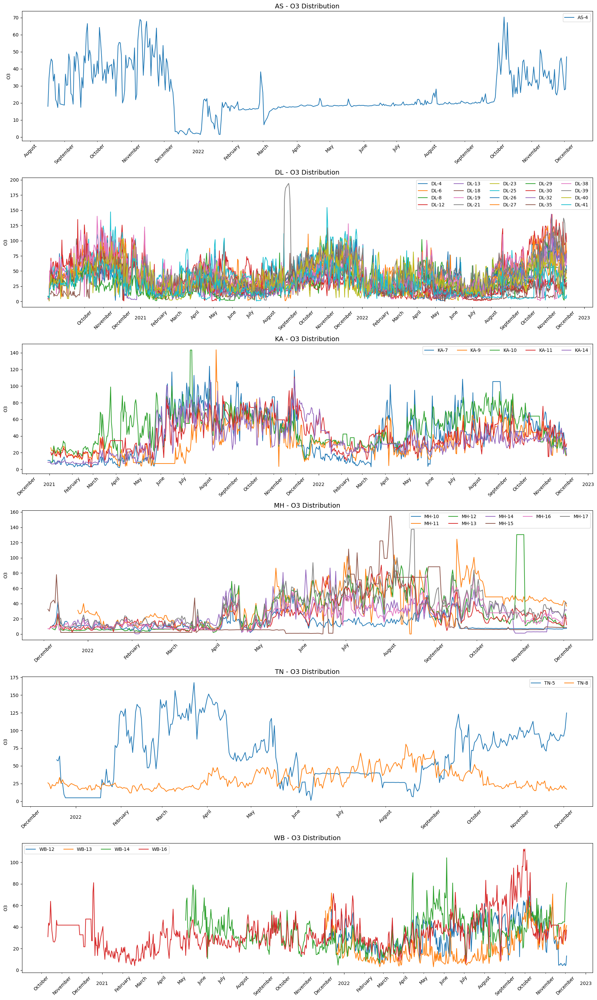

In [ ]:
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(18,30))

for idx, code in enumerate(df.StateCode.unique()):
    count = 0
    for ss in mapping[code]:
        # if ss.startswith(code):
        ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss]['O3'], label=ss, ax=axes[idx])
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(monthsFmt)
        plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(yearsFmt)
        ax.legend(loc="best", ncols=5)
        ax.set_xlabel("")
    ax.set_title(f"{code} - O3 Distribution", fontsize=14)

plt.tight_layout()
plt.show()

### CO Distribution

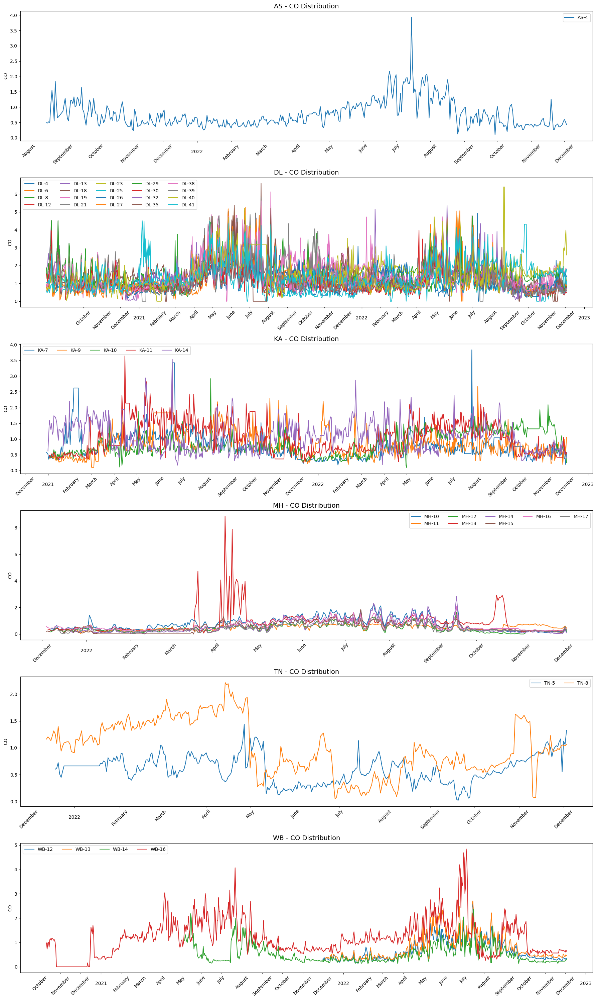

In [ ]:
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(18,30))

for idx, code in enumerate(df.StateCode.unique()):
    count = 0
    for ss in mapping[code]:
        # if ss.startswith(code):
        ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss]['CO'], label=ss, ax=axes[idx])
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(monthsFmt)
        plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(yearsFmt)
        ax.legend(loc="best", ncols=5)
        ax.set_xlabel("")
    ax.set_title(f"{code} - CO Distribution", fontsize=14)

plt.tight_layout()
plt.show()

### SO2 Distribution

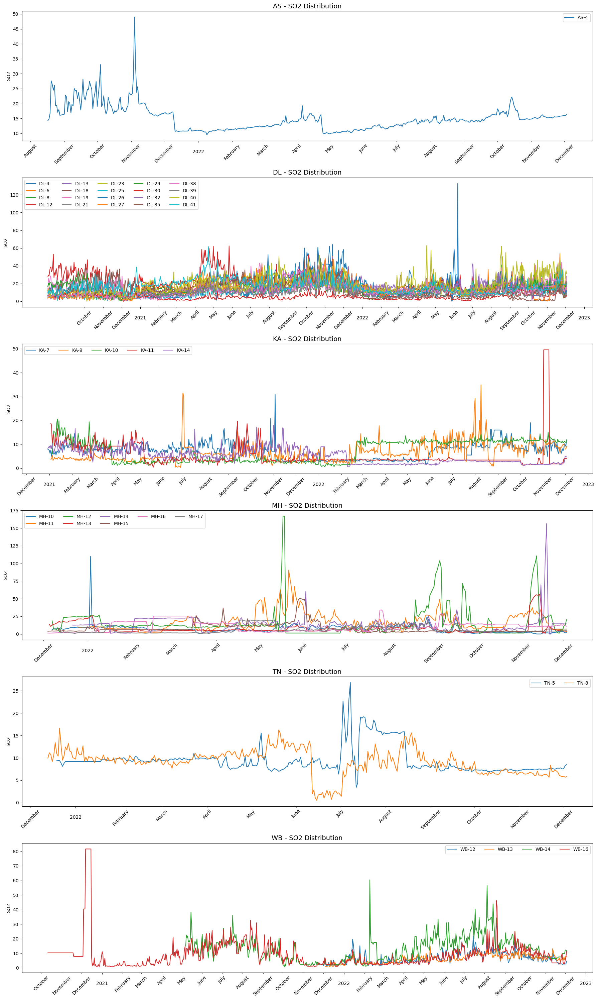

In [ ]:
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(18,30))

for idx, code in enumerate(df.StateCode.unique()):
    count = 0
    for ss in mapping[code]:
        # if ss.startswith(code):
        ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss]['SO2'], label=ss, ax=axes[idx])
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(monthsFmt)
        plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(yearsFmt)
        ax.legend(loc="best", ncols=5)
        ax.set_xlabel("")
    ax.set_title(f"{code} - SO2 Distribution", fontsize=14)

plt.tight_layout()
plt.show()

### Correlation Plot

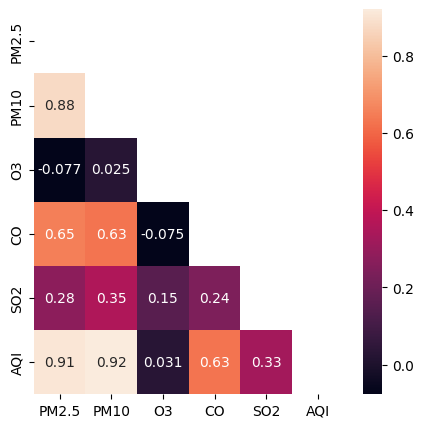

In [ ]:
fig = plt.figure(figsize=(5,5))
mask = np.triu(np.ones((6,6)))
sns.heatmap(df[relevant_cols].corr(), annot=True, mask=mask)
plt.show()

In [ ]:
df.head()

,ID_Date,StateCode,StationId,PM2.5,PM10,O3,CO,SO2,AQI,year,month,StateStation
Date,,,,,,,,,,,,
2021-08-17,AS_4_2021-08-17,AS,4,51.8364,120.3702,18.0234,0.4896,14.3106,94.0,2021,8,AS-4
2021-08-18,AS_4_2021-08-18,AS,4,59.4762,87.0978,34.5270,0.4794,14.7594,124.0,2021,8,AS-4
2021-08-19,AS_4_2021-08-19,AS,4,61.0776,79.6008,42.0546,0.5202,16.7484,82.0,2021,8,AS-4
2021-08-20,AS_4_2021-08-20,AS,4,56.7222,94.2072,45.7878,0.4998,27.6114,107.0,2021,8,AS-4
2021-08-21,AS_4_2021-08-21,AS,4,85.3332,136.7820,44.5638,1.1118,26.4180,107.0,2021,8,AS-4


In [ ]:
aqi_state_station_group = df.groupby(by="StateStation")

In [ ]:
aqi_state_station_group[relevant_cols].corr()

PM2.5      PM10        O3        CO       SO2       AQI
StateStation                                                                  
AS-4         PM2.5  1.000000  0.778415 -0.017181  0.652175  0.281184  0.590783
             PM10   0.778415  1.000000 -0.026304  0.551540  0.178371  0.760097
             O3    -0.017181 -0.026304  1.000000 -0.169027  0.670435 -0.053421
             CO     0.652175  0.551540 -0.169027  1.000000  0.008864  0.705034
             SO2    0.281184  0.178371  0.670435  0.008864  1.000000  0.058973
             AQI    0.590783  0.760097 -0.053421  0.705034  0.058973  1.000000
DL-12        PM2.5  1.000000  0.809699 -0.275091  0.627167  0.191460  0.854371
             PM10   0.809699  1.000000 -0.159002  0.624240  0.402224  0.879750
             O3    -0.275091 -0.159002  1.000000 -0.266919  0.240264 -0.064032
             CO     0.627167  0.624240 -0.266919  1.000000  0.393783  0.565158
             SO2    0.191460  0.402224  0.240264  0.393783  1.000000  0.304764
             AQI    0.854371  0.879750 -0.064032  0.565158  0.304764  1.000000
DL-13        PM2.5  1.000000  0.818698 -0.266570  0.715933  0.184533  0.872923
             PM10   0.818698  1.000000 -0.209271  0.702888  0.211490  0.912260
             O3    -0.266570 -0.209271  1.000000 -0.261339  0.123856 -0.219291
             CO     0.715933  0.702888 -0.261339  1.000000  0.201894  0.713883
             SO2    0.184533  0.211490  0.123856  0.201894  1.000000  0.188653
             AQI    0.872923  0.912260 -0.219291  0.713883  0.188653  1.000000
DL-18        PM2.5  1.000000  0.914407 -0.178305  0.768068  0.147884  0.926785
             PM10   0.914407  1.000000 -0.010276  0.734858  0.316490  0.933235
             O3    -0.178305 -0.010276  1.000000  0.008606  0.679185 -0.080859
             CO     0.768068  0.734858  0.008606  1.000000  0.306489  0.733415
             SO2    0.147884  0.316490  0.679185  0.306489  1.000000  0.258285
             AQI    0.926785  0.933235 -0.080859  0.733415  0.258285  1.000000
DL-19        PM2.5  1.000000  0.849772 -0.303144  0.642696  0.117902  0.908909
             PM10   0.849772  1.000000 -0.111965  0.632135  0.191179  0.893145
             O3    -0.303144 -0.111965  1.000000 -0.160495  0.358415 -0.195546
             CO     0.642696  0.632135 -0.160495  1.000000  0.295496  0.603806
             SO2    0.117902  0.191179  0.358415  0.295496  1.000000  0.149035
             AQI    0.908909  0.893145 -0.195546  0.603806  0.149035  1.000000
DL-21        PM2.5  1.000000  0.901055 -0.149744  0.699871  0.146511  0.910066
             PM10   0.901055  1.000000  0.019310  0.715326  0.229815  0.915488
             O3    -0.149744  0.019310  1.000000 -0.129075  0.329020 -0.016631
             CO     0.699871  0.715326 -0.129075  1.000000  0.113340  0.667843
             SO2    0.146511  0.229815  0.329020  0.113340  1.000000  0.170868
             AQI    0.910066  0.915488 -0.016631  0.667843  0.170868  1.000000
DL-23        PM2.5  1.000000  0.852067  0.020289  0.592088  0.296996  0.888079
             PM10   0.852067  1.000000  0.062410  0.515174  0.336037  0.919836
             O3     0.020289  0.062410  1.000000 -0.202981  0.184644  0.066193
             CO     0.592088  0.515174 -0.202981  1.000000  0.002593  0.523146
             SO2    0.296996  0.336037  0.184644  0.002593  1.000000  0.319231
             AQI    0.888079  0.919836  0.066193  0.523146  0.319231  1.000000
DL-25        PM2.5  1.000000  0.758430 -0.176985  0.229396  0.035271  0.882640
             PM10   0.758430  1.000000  0.045961  0.213356  0.042960  0.805113
             O3    -0.176985  0.045961  1.000000 -0.166111  0.291916 -0.018513
             CO     0.229396  0.213356 -0.166111  1.000000 -0.316531  0.219568
             SO2    0.035271  0.042960  0.291916 -0.316531  1.000000 -0.012108
             AQI    0.882640  0.805113 -0.018513  0.219568 -0.012108  1.000000
DL-26        PM2.5  1.000000  0.839773 -0.084607  0.486458  0.205507  0.8

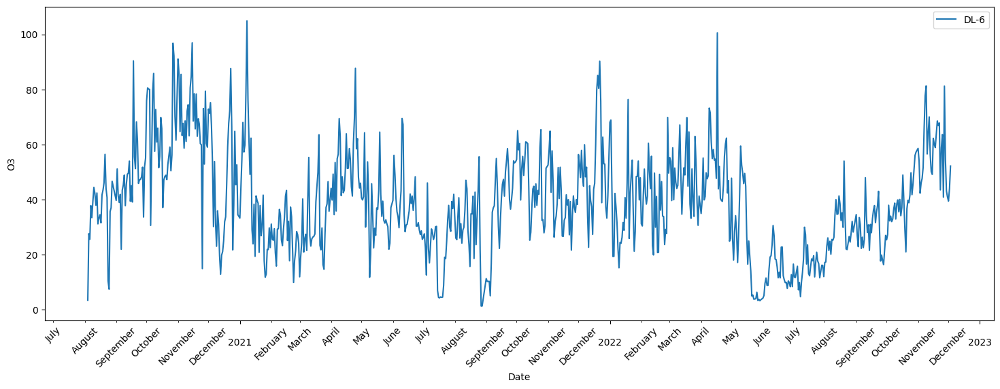

In [60]:
fig = plt.figure(figsize=(18,6))
# # for ss in df.StateStation.unique():
#     if ss.startswith("AS"):
ss = "DL-6"
ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss].O3, label=ss)

ax.xaxis.set_minor_locator(months)
ax.xaxis.set_minor_formatter(monthsFmt)
plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(yearsFmt)

plt.show()

In [ ]:
# fig = plt.figure(figsize=(18,6))
# for ss in df.StateStation.unique():
#     if ss.startswith("DL"):
#         ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss].AQI, label=ss)

# ax.xaxis.set_minor_locator(months)
# ax.xaxis.set_minor_formatter(monthsFmt)
# plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
# ax.xaxis.set_major_locator(years)
# ax.xaxis.set_major_formatter(yearsFmt)

# plt.show()

In [ ]:
# fig = plt.figure(figsize=(18,6))
# for ss in df.StateStation.unique():
#     if ss.startswith("MH"):
#         ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss].AQI, label=ss)

# ax.xaxis.set_minor_locator(months)
# ax.xaxis.set_minor_formatter(monthsFmt)
# plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
# ax.xaxis.set_major_locator(years)
# ax.xaxis.set_major_formatter(yearsFmt)

# plt.show()

In [ ]:
# fig = plt.figure(figsize=(18,6))
# for ss in df.StateStation.unique():
#     if ss.startswith("KA"):
#         ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss].AQI, label=ss)

# ax.xaxis.set_minor_locator(months)
# ax.xaxis.set_minor_formatter(monthsFmt)
# plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
# ax.xaxis.set_major_locator(years)
# ax.xaxis.set_major_formatter(yearsFmt)

# plt.show()

In [ ]:
# fig = plt.figure(figsize=(18,6))
# for ss in df.StateStation.unique():
#     if ss.startswith("WB"):
#         ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss].AQI, label=ss)

# ax.xaxis.set_minor_locator(months)
# ax.xaxis.set_minor_formatter(monthsFmt)
# plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
# ax.xaxis.set_major_locator(years)
# ax.xaxis.set_major_formatter(yearsFmt)

# plt.show()

In [ ]:
# fig = plt.figure(figsize=(18,6))
# for ss in df.StateStation.unique():
#     if ss.startswith("TN"):
#         ax = sns.lineplot(x=df[df.StateStation == ss].index, y=df[df.StateStation == ss].AQI, label=ss)

# ax.xaxis.set_minor_locator(months)
# ax.xaxis.set_minor_formatter(monthsFmt)
# plt.setp(ax.xaxis.get_minorticklabels(), rotation=45)
# ax.xaxis.set_major_locator(years)
# ax.xaxis.set_major_formatter(yearsFmt)

# plt.show()